In [1]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt

print(f"Script run at: {dt.now()}")

Script run at: 2025-09-18 15:27:38.323671


## Data Loading and Initial Exploration

In [2]:
# Reading the dataset
print(dt.now())
print("Reading the dataset...")
df= pd.read_csv(r'Raw Data/Customer Credit Scoring_Train.csv')
df.head()

2025-09-18 15:27:38.338991
Reading the dataset...


C:\Users\PRASAD\AppData\Local\Temp\ipykernel_24432\3796109264.py:4: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df= pd.read_csv(r'Raw Data/Customer Credit Scoring_Train.csv')


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [4]:
! pip install pandas-profiling

  Using cached PyYAML-6.0.2-cp311-cp311-win_amd64.whl.metadata (2.1 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached attrs-25.3.0-py3-none-any.whl.metadata (10 kB)
  Using cached networkx-3.5-py3-none-any.whl.metadata (6.3 kB)
   ---------------------------------------- 0.0/4.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/4.7 MB ? eta -:--:--
   ---- ----------------------------------- 0.5/4.7 MB 1.5 MB/s eta 0:00:03
   ------ --------------------------------- 0.8/4.7 MB 1.5 MB/s eta 0:00:03
   -------- ------------------------------- 1.0/4.7 MB 1.5 MB/s eta 0:00:03
   ------------- -------------------------- 1.6/4.7 MB 1.6 MB/s eta 0:00:02
   --------------- ------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imbalanced-learn 0.14.0 requires joblib<2,>=1.2.0, but you have joblib 1.1.1 which is incompatible.
scikit-learn 1.7.2 requires joblib>=1.2.0, but you have joblib 1.1.1 which is incompatible.


In [3]:
## Displaying basic information about the dataset
print(dt.now())
print("Displaying basic information about the dataset...")
df.info()

2025-09-18 14:55:12.876306
Displaying basic information about the dataset...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan             

In [4]:
## Checking Unique values in each column
print("Checking Unique values in each column...")   
unique_values_info=df.nunique().reset_index()
unique_values_info.columns=['Column Name','No. of Unique Values']
unique_values_info.to_csv(r'Results/EDA Results/Reports/unique_values_info'+dt.now().strftime("%Y-%m-%d_%H_%M")+'.csv',index=False)
unique_values_info

Checking Unique values in each column...


,Column Name,No. of Unique Values
0,ID,100000
1,Customer_ID,12500
2,Month,8
3,Name,10139
4,Age,1788
5,SSN,12501
6,Occupation,16
7,Annual_Income,18940
8,Monthly_Inhand_Salary,13235
9,Num_Bank_Accounts,943


In [5]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

## Exploratory Data Analsysis

In [6]:
## Remiving unnecessary columns
print("Removing unnecessary columns...")
df.drop(columns=['ID', 'Customer_ID', 'Month', 'Name','SSN','Type_of_Loan'],inplace=True)

# We are removing ID, Customer_ID, Month, Name, SSN and Type_of_Loan as they are not useful for the analysis because .
# Type of Loan has  lot of missing values and also it has too many unique values (598) which will not be useful for the analysis.

Removing unnecessary columns...


### Datatype Conversion

In [7]:
## Displying Data at Datatype wise
print(dt.now())
print("Displying Data at Datatype wise...")

## Displying string type columns
df.select_dtypes(include=['object']).head()


2025-09-18 14:55:13.533965
Displying Data at Datatype wise...


,Age,Occupation,Annual_Income,Num_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,23,Scientist,19114.12,4,7,11.27,_,809.98,22 Years and 1 Months,No,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,23,Scientist,19114.12,4,NaN,11.27,Good,809.98,NaN,No,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,-500,Scientist,19114.12,4,7,_,Good,809.98,22 Years and 3 Months,No,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,23,Scientist,19114.12,4,4,6.27,Good,809.98,22 Years and 4 Months,No,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,23,Scientist,19114.12,4,NaN,11.27,Good,809.98,22 Years and 5 Months,No,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [8]:
# Displying Numeric type columns
df.select_dtypes(include=['number']).head()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
0,1824.843333,3,4,3,3,4.0,26.822620,49.574949
1,NaN,3,4,3,-1,4.0,31.944960,49.574949
2,NaN,3,4,3,3,4.0,28.609352,49.574949
3,NaN,3,4,3,5,4.0,31.377862,49.574949
4,1824.843333,3,4,3,6,4.0,24.797347,49.574949


In [9]:
## We found that some columns have '_' in their values which is causing the datatype to be object. We will remove '_' and convert them to appropriate datatypes.

df.Age=df.Age.apply(lambda x : x.replace('_','')).astype(int)

df.Annual_Income=df.Annual_Income.apply(lambda x: x.replace('_','')).astype(float)

df.Num_of_Loan=df.Num_of_Loan.apply(lambda x : x.replace('_','')).astype('Int32')

df.Num_of_Delayed_Payment=df.Num_of_Delayed_Payment.astype(str).apply(lambda x : x.replace('_','')).apply(lambda x : x if x.isdigit() else np.nan).astype('Int32')

df.Changed_Credit_Limit=df.Changed_Credit_Limit.apply(lambda x: x.replace('_','')).apply(lambda x : np.nan if x=='' else x).astype(float)

df.Outstanding_Debt=df.Outstanding_Debt.apply(lambda x: x.replace('_','')).astype(float)

df.Amount_invested_monthly=df.Amount_invested_monthly.astype(str).apply(lambda x: x.replace('_','')).astype(float)

df.Monthly_Balance=df.Monthly_Balance.astype(str).apply(lambda x : x.replace('_','')).astype(float)

In [10]:
df.select_dtypes(include=['object']).head()

,Occupation,Credit_Mix,Credit_History_Age,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
0,Scientist,_,22 Years and 1 Months,No,High_spent_Small_value_payments,Good
1,Scientist,Good,NaN,No,Low_spent_Large_value_payments,Good
2,Scientist,Good,22 Years and 3 Months,No,Low_spent_Medium_value_payments,Good
3,Scientist,Good,22 Years and 4 Months,No,Low_spent_Small_value_payments,Good
4,Scientist,Good,22 Years and 5 Months,No,High_spent_Medium_value_payments,Good


In [11]:
df.select_dtypes(include=['number']).head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,23,19114.12,1824.843333,3,4,3,4,3,7,11.27,4.0,809.98,26.822620,49.574949,80.415295,312.494089
1,23,19114.12,NaN,3,4,3,4,-1,<NA>,11.27,4.0,809.98,31.944960,49.574949,118.280222,284.629162
2,-500,19114.12,NaN,3,4,3,4,3,7,NaN,4.0,809.98,28.609352,49.574949,81.699521,331.209863
3,23,19114.12,NaN,3,4,3,4,5,4,6.27,4.0,809.98,31.377862,49.574949,199.458074,223.451310
4,23,19114.12,1824.843333,3,4,3,4,6,<NA>,11.27,4.0,809.98,24.797347,49.574949,41.420153,341.489231


### Converting Credit_History_Age into months

In [12]:

# Why beacuse it is in the format of 'X Years and Y Months' which is not useful for analysis. We will convert it into months.
import re


def credit_history_to_months(val):
    if pd.isna(val):
        return np.nan
    match = re.match(r'(\d+)\s*Years?\s*and\s*(\d+)\s*Months?', val)
    if match:
        years = int(match.group(1))
        months = int(match.group(2))
        return years * 12 + months 
    else:
        return np.nan

df['Credit_History_Age']=df['Credit_History_Age'].apply(credit_history_to_months)


In [13]:
# Converting 'Yes'/'No' to 1/0 in Payment_of_Min_Amount column
df.Payment_of_Min_Amount=df.Payment_of_Min_Amount.apply(lambda x : 1 if x=='Yes' else 0)
                                                

In [14]:
df.select_dtypes(include=['number']).head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
0,23,19114.12,1824.843333,3,4,3,4,3,7,11.27,4.0,809.98,26.822620,265.0,0,49.574949,80.415295,312.494089
1,23,19114.12,NaN,3,4,3,4,-1,<NA>,11.27,4.0,809.98,31.944960,NaN,0,49.574949,118.280222,284.629162
2,-500,19114.12,NaN,3,4,3,4,3,7,NaN,4.0,809.98,28.609352,267.0,0,49.574949,81.699521,331.209863
3,23,19114.12,NaN,3,4,3,4,5,4,6.27,4.0,809.98,31.377862,268.0,0,49.574949,199.458074,223.451310
4,23,19114.12,1824.843333,3,4,3,4,6,<NA>,11.27,4.0,809.98,24.797347,269.0,0,49.574949,41.420153,341.489231


In [15]:
df.select_dtypes(include=['object']).head()

,Occupation,Credit_Mix,Payment_Behaviour,Credit_Score
0,Scientist,_,High_spent_Small_value_payments,Good
1,Scientist,Good,Low_spent_Large_value_payments,Good
2,Scientist,Good,Low_spent_Medium_value_payments,Good
3,Scientist,Good,Low_spent_Small_value_payments,Good
4,Scientist,Good,High_spent_Medium_value_payments,Good


In [16]:
df.Credit_Mix.value_counts()

Credit_Mix
Standard    36479
Good        24337
_           20195
Bad         18989
Name: count, dtype: int64

In [17]:
## Checking for missing values
print("Checking for missing values...")
missing_data_info=df.isna().sum() /df.shape[0]
missing_data_info=missing_data_info.reset_index()
missing_data_info.columns=['Column Name','% Missing Values']
missing_data_info.to_csv(r'Results/EDA Results/Reports/missing_data_info'+dt.now().strftime("%Y-%m-%d_%H_%M")+'.csv',index=False)
missing_data_info

Checking for missing values...


,Column Name,% Missing Values
0,Age,0.00000
1,Occupation,0.00000
2,Annual_Income,0.00000
3,Monthly_Inhand_Salary,0.15002
4,Num_Bank_Accounts,0.00000
5,Num_Credit_Card,0.00000
6,Interest_Rate,0.00000
7,Num_of_Loan,0.00000
8,Delay_from_due_date,0.00000
9,Num_of_Delayed_Payment,0.07646


### Filling Monthly_Inhand_Salary missing values using the Occupation average

In [18]:
# Fill missing Monthly_Inhand_Salary values with the mean for each Occupation
df['Monthly_Inhand_Salary'] = df.groupby('Occupation')['Monthly_Inhand_Salary'].transform(
    lambda x: x.fillna(x.mean())
)

### summary statistics for numeric columns

In [19]:
df.describe(exclude=['object'],percentiles=[0.02,0.03,0.05,.25,.5,.75,.90,.95,.97,.98,.99]).T

,count,mean,std,min,2%,3%,5%,25%,50%,75%,90%,95%,97%,98%,99%,max
Age,100000.0,110.6497,686.244717,-500.0,14.0,15.0,16.0,24.0,33.0,42.0,50.0,53.0,55.0,56.0,4112.07,8698.0
Annual_Income,100000.0,176415.701298,1429618.051414,7005.93,8137.625,8761.63,9743.51,19457.5,37578.61,72790.92,113085.87,134533.32,149616.12,166837.64,179987.28,24198062.0
Monthly_Inhand_Salary,100000.0,4194.241611,2935.323287,303.645417,647.480833,738.54125,888.56375,1792.084167,3852.736667,5371.525,8595.465,10474.431,11457.17,12156.320267,13580.73,15204.633333
Num_Bank_Accounts,100000.0,17.09128,117.404834,-1.0,0.0,0.0,1.0,3.0,6.0,7.0,9.0,10.0,10.0,10.0,445.01,1798.0
Num_Credit_Card,100000.0,22.47443,129.05741,0.0,1.0,2.0,3.0,4.0,5.0,7.0,9.0,10.0,10.0,171.02,849.0,1499.0
Interest_Rate,100000.0,72.46604,466.422621,1.0,1.0,2.0,2.0,8.0,13.0,20.0,29.0,33.0,34.0,128.16,2865.01,5797.0
Num_of_Loan,100000.0,3.00996,62.647879,-100.0,-100.0,-100.0,0.0,1.0,3.0,5.0,7.0,8.0,9.0,9.0,9.0,1496.0
Delay_from_due_date,100000.0,21.06878,14.860104,-5.0,1.0,1.0,3.0,10.0,18.0,28.0,45.0,54.0,57.0,59.0,61.0,67.0
Num_of_Delayed_Payment,92354.0,31.150519,226.802173,0.0,1.0,1.0,2.0,9.0,14.0,18.0,21.0,24.0,25.0,25.0,27.0,4397.0
Changed_Credit_Limit,97909.0,10.389025,6.789496,-6.49,0.52,0.72,1.16,5.32,9.4,14.87,19.44,23.6,25.97,27.27,28.81,36.97


### Box plots for numeric columns to identify outliers

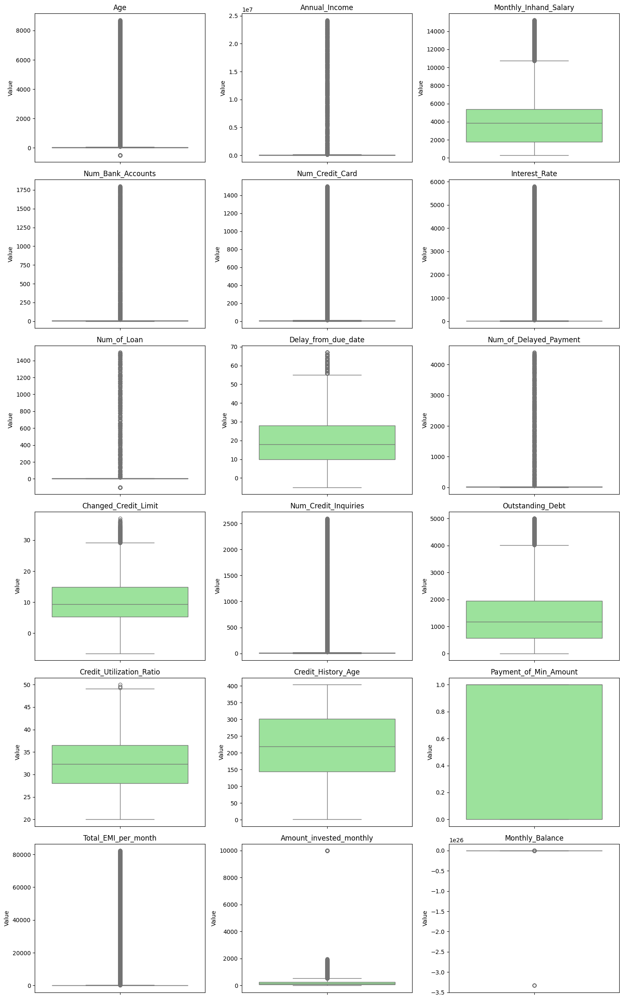

In [20]:
# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Set up subplots
n_cols = 3  # Number of plots per row
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

for i, col in enumerate(numeric_cols):
    row, col_idx = divmod(i, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    sns.boxplot(y=df[col], ax=ax, color='lightgreen')
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('Value')

# Hide any unused subplots
for j in range(i + 1, n_rows * n_cols):
    row, col_idx = divmod(j, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    ax.axis('off')

plt.tight_layout()
plt.show()

### Distribution plots for numeric columns

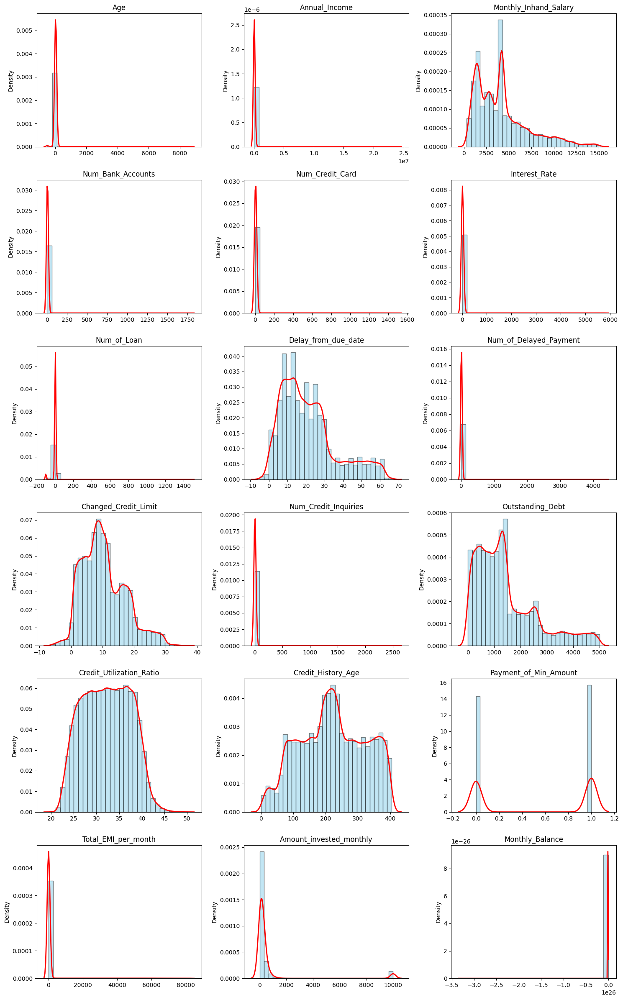

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Set up subplots
n_cols = 3  # Number of plots per row
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

for i, col in enumerate(numeric_cols):
    row, col_idx = divmod(i, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    # Histogram
    df[col].plot(kind='hist', bins=30, ax=ax, alpha=0.5, color='skyblue', edgecolor='black', density=True)
    # Distribution line
    sns.kdeplot(df[col].dropna(), ax=ax, color='red', linewidth=2)
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('Density')

# Hide any unused subplots
for j in range(i + 1, n_rows * n_cols):
    row, col_idx = divmod(j, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    ax.axis('off')

plt.tight_layout()
plt.show()

In [20]:
# Columns Wise Missing Value treatment
df.columns

Index(['Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [21]:
df.describe(exclude=['object'],percentiles=[0.02,0.03,0.05,.25,.5,.75,.90,.95,.97,.98,.99]).T

,count,mean,std,min,2%,3%,5%,25%,50%,75%,90%,95%,97%,98%,99%,max
Age,100000.0,110.6497,686.244717,-500.0,14.0,15.0,16.0,24.0,33.0,42.0,50.0,53.0,55.0,56.0,4112.07,8698.0
Annual_Income,100000.0,176415.701298,1429618.051414,7005.93,8137.625,8761.63,9743.51,19457.5,37578.61,72790.92,113085.87,134533.32,149616.12,166837.64,179987.28,24198062.0
Monthly_Inhand_Salary,100000.0,4194.241611,2935.323287,303.645417,647.480833,738.54125,888.56375,1792.084167,3852.736667,5371.525,8595.465,10474.431,11457.17,12156.320267,13580.73,15204.633333
Num_Bank_Accounts,100000.0,17.09128,117.404834,-1.0,0.0,0.0,1.0,3.0,6.0,7.0,9.0,10.0,10.0,10.0,445.01,1798.0
Num_Credit_Card,100000.0,22.47443,129.05741,0.0,1.0,2.0,3.0,4.0,5.0,7.0,9.0,10.0,10.0,171.02,849.0,1499.0
Interest_Rate,100000.0,72.46604,466.422621,1.0,1.0,2.0,2.0,8.0,13.0,20.0,29.0,33.0,34.0,128.16,2865.01,5797.0
Num_of_Loan,100000.0,3.00996,62.647879,-100.0,-100.0,-100.0,0.0,1.0,3.0,5.0,7.0,8.0,9.0,9.0,9.0,1496.0
Delay_from_due_date,100000.0,21.06878,14.860104,-5.0,1.0,1.0,3.0,10.0,18.0,28.0,45.0,54.0,57.0,59.0,61.0,67.0
Num_of_Delayed_Payment,92354.0,31.150519,226.802173,0.0,1.0,1.0,2.0,9.0,14.0,18.0,21.0,24.0,25.0,25.0,27.0,4397.0
Changed_Credit_Limit,97909.0,10.389025,6.789496,-6.49,0.52,0.72,1.16,5.32,9.4,14.87,19.44,23.6,25.97,27.27,28.81,36.97


In [22]:
#Age
df.Age=np.clip(df.Age,a_min=18,a_max=df.Age.quantile(0.98))

# Annual_Income
df.Annual_Income=np.clip(df.Annual_Income,a_min=df.Annual_Income.min(),a_max=df.Annual_Income.quantile(0.98))

#Num_of_Loan
df.Num_of_Loan=np.clip(df.Num_of_Loan,a_min=df.Num_of_Loan.quantile(0.05),a_max=df.Num_of_Loan.quantile(0.98))



In [23]:
# Out liers treatment for numeric columns
# Clip outliers for all numeric columns at 1% and 99% quantiles
numeric_cols = df.select_dtypes(include=['number']).columns

for col in numeric_cols:
    lower = df[col].quantile(0.01)
    upper = df[col].quantile(0.98)
    df[col] = df[col].clip(lower=lower, upper=upper)

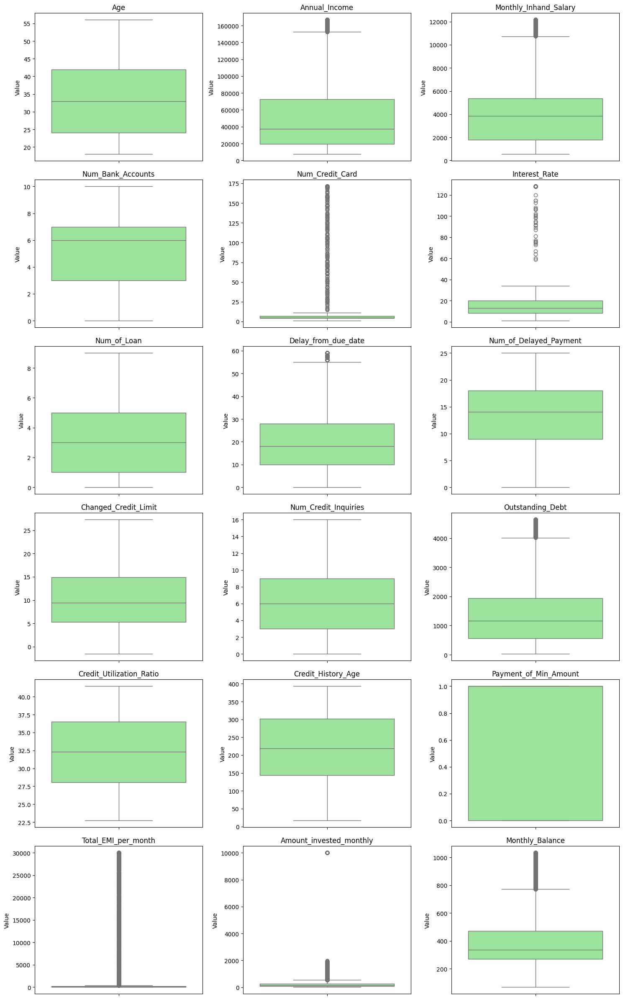

In [24]:
# Select all numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Set up subplots
n_cols = 3  # Number of plots per row
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))

for i, col in enumerate(numeric_cols):
    row, col_idx = divmod(i, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    sns.boxplot(y=df[col], ax=ax, color='lightgreen')
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('Value')

# Hide any unused subplots
for j in range(i + 1, n_rows * n_cols):
    row, col_idx = divmod(j, n_cols)
    ax = axes[row, col_idx] if n_rows > 1 else axes[col_idx]
    ax.axis('off')

plt.tight_layout()
plt.show()

In [25]:
df.select_dtypes(include=['object']).head()

,Occupation,Credit_Mix,Payment_Behaviour,Credit_Score
0,Scientist,_,High_spent_Small_value_payments,Good
1,Scientist,Good,Low_spent_Large_value_payments,Good
2,Scientist,Good,Low_spent_Medium_value_payments,Good
3,Scientist,Good,Low_spent_Small_value_payments,Good
4,Scientist,Good,High_spent_Medium_value_payments,Good


In [26]:
df.Payment_Behaviour.unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments', '!@9#%8',
       'High_spent_Large_value_payments'], dtype=object)

In [27]:
map_df={'Low_spent_Small_value_payments':1,
 'Low_spent_Medium_value_payments':2,
 'Low_spent_Large_value_payments':3,
 'High_spent_Small_value_payments':4,
 'High_spent_Medium_value_payments':5,
 'High_spent_Large_value_payments':6,
 '!@9#%8':np.nan
 }
df.Payment_Behaviour=df.Payment_Behaviour.map(map_df)

In [28]:
df.Credit_Mix=df.Credit_Mix.map({'Good':3,'Standard':2,'Bad':1,'_':np.nan})

In [29]:
Target=df['Credit_Score']

df_Occupation=df[['Occupation']].copy()

df.drop(columns=['Occupation','Credit_Score'],inplace=True)

In [30]:
from sklearn.impute import KNNImputer

In [31]:
df.select_dtypes(include=['object']).head()

""
0
1
2
3
4


In [32]:
df.select_dtypes(include=['number']).head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,23,19114.12,1824.843333,3,4.0,3.0,4,3,7,11.27,4.0,NaN,809.98,26.822620,265.0,0,49.574949,80.415295,4.0,312.494089
1,23,19114.12,4267.133667,3,4.0,3.0,4,0,<NA>,11.27,4.0,3.0,809.98,31.944960,NaN,0,49.574949,118.280222,3.0,284.629162
2,18,19114.12,4267.133667,3,4.0,3.0,4,3,7,NaN,4.0,3.0,809.98,28.609352,267.0,0,49.574949,81.699521,2.0,331.209863
3,23,19114.12,4267.133667,3,4.0,3.0,4,5,4,6.27,4.0,3.0,809.98,31.377862,268.0,0,49.574949,199.458074,1.0,223.451310
4,23,19114.12,1824.843333,3,4.0,3.0,4,6,<NA>,11.27,4.0,3.0,809.98,24.797347,269.0,0,49.574949,41.420153,5.0,341.489231


In [33]:

# Select only numeric columns for imputation
numeric_cols = df.select_dtypes(include=['number']).columns
imputer = KNNImputer(n_neighbors=5, weights='uniform')

# Impute missing values
df[numeric_cols] = imputer.fit_transform(df[numeric_cols])

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 20 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Age                       100000 non-null  float64
 1   Annual_Income             100000 non-null  float64
 2   Monthly_Inhand_Salary     100000 non-null  float64
 3   Num_Bank_Accounts         100000 non-null  float64
 4   Num_Credit_Card           100000 non-null  float64
 5   Interest_Rate             100000 non-null  float64
 6   Num_of_Loan               100000 non-null  float64
 7   Delay_from_due_date       100000 non-null  float64
 8   Num_of_Delayed_Payment    100000 non-null  float64
 9   Changed_Credit_Limit      100000 non-null  float64
 10  Num_Credit_Inquiries      100000 non-null  float64
 11  Credit_Mix                100000 non-null  float64
 12  Outstanding_Debt          100000 non-null  float64
 13  Credit_Utilization_Ratio  100000 non-null  fl

In [36]:
import pickle

# Save the fitted imputer to a .pkl file
with open('Models/knn_imputer'+dt.now().strftime("%Y-%m-%d_%H_%M")+'.pkl', 'wb') as f:
    pickle.dump(imputer, f)

In [37]:

df['Credit_Score']=Target
df['Occupation']=df_Occupation['Occupation']
df.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Occupation
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.270,...,809.98,26.822620,265.0,0.0,49.574949,80.415295,4.0,312.494089,Good,Scientist
1,23.0,19114.12,4267.133667,3.0,4.0,3.0,4.0,0.0,6.4,11.270,...,809.98,31.944960,247.6,0.0,49.574949,118.280222,3.0,284.629162,Good,Scientist
2,18.0,19114.12,4267.133667,3.0,4.0,3.0,4.0,3.0,7.0,7.076,...,809.98,28.609352,267.0,0.0,49.574949,81.699521,2.0,331.209863,Good,Scientist
3,23.0,19114.12,4267.133667,3.0,4.0,3.0,4.0,5.0,4.0,6.270,...,809.98,31.377862,268.0,0.0,49.574949,199.458074,1.0,223.451310,Good,Scientist
4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,6.0,6.4,11.270,...,809.98,24.797347,269.0,0.0,49.574949,41.420153,5.0,341.489231,Good,Scientist


In [38]:
print(dt.now())
df.to_csv(r'Raw Data/Cleaned_Data/Cleaned_data'+dt.now().strftime("%Y-%m-%d_%H_%M")+'.csv', index=False)
print(dt.now())

2025-09-18 15:06:55.701329
2025-09-18 15:06:57.919793


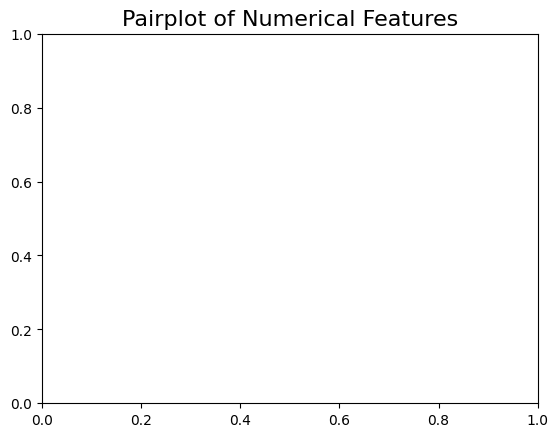

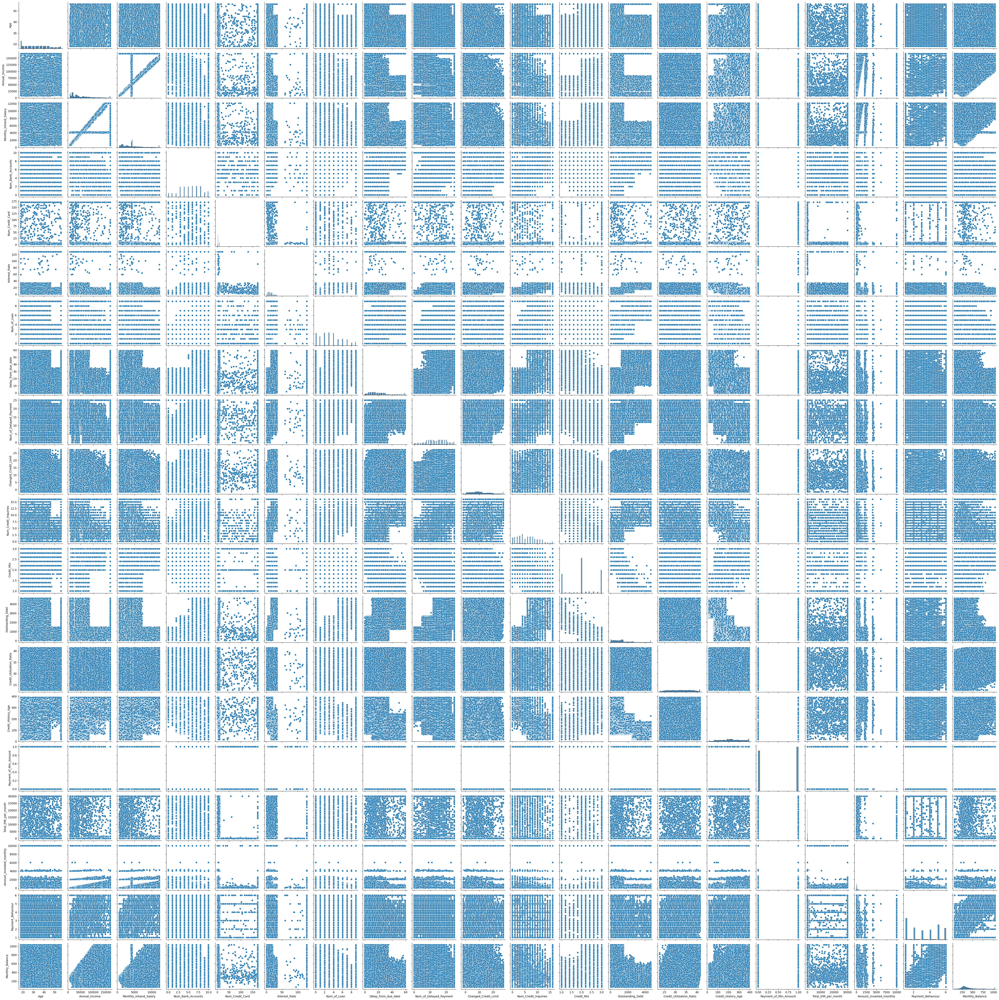

In [39]:

plt.title('Pairplot of Numerical Features', fontsize=16)   
sns.pairplot(df)
plt.show()

In [ ]:
# Heat Map
sns.heatmap(df.select_dtypes('number'),annot=True,cmap='Blues')
plt.show()

In [ ]:
import y_data_profiler as ydp
profile = ydp.DataPofiler(df)  
profile.to_file(output_file=r'Results/EDA Results/Reports/Ydata_profile_report'+dt.now().strftime("%Y-%m-%d_%H_%M")+'.html')